<h1><center>ISIS / Al Qaeda Machine Learning Classification</center></h1>
<h2><center> DATS 6202: Machine Learning I </center></h2>

* Stephen Davanzo
* Eva Schwartz
* Joshua Gray

## Intro

For our project, we wanted to explore the application of machine learning techniques to predict the affiliation of terrorist actors in the Sahel region of Africa using data from the Armed Conflict Location & Event Data Project (ACLED). The Sahel has become a hotspot for violent extremism, with numerous armed groups operating across borders and engaging in frequent, deadly clashes. Understanding which Violent Extremist Groups (VEOs) are responsible for specific incidents can significantly aid counterterrorism efforts, policymaking, and humanitarian responses. By leveraging event-level data such as location, time, type of violence, and target characteristics, this project aims to build predictive models that can identify whether the perpetrating group belongs to ISIS, Al Qaeda, or neither, providing insights into patterns of militant activity and regional conflict dynamics.

## Notebook Configuration

In [5]:
# importing initial libraries
import pandas as pd
import folium as fo
import regex as re
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)


# ignoring warnings
import warnings
# Ignore warnings
warnings.filterwarnings('ignore')

In [6]:
# initializing matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

# Set matplotlib sizes
plt.rc('font', size=20)
plt.rc('axes', titlesize=20)
plt.rc('axes', labelsize=20)
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.rc('legend', fontsize=20)
plt.rc('figure', titlesize=20)

In [7]:
# setting random seed
random_seed = 42

# Set random seed in numpy
import numpy as np
np.random.seed(random_seed)

## Data Input

We will be using the Armed Conflict Location & Event Data Project (ACLED) data set to train our models. The ACLED is a comprehensive, real-time database that collects data on political violence and protest events across the world. Each record in the dataset represents a single event and includes key attributes such as the date, location, involved actors, event type, fatalities, and source notes. This dataset is particularly well-suited for training machine learning models aimed at predicting the affiliation of terrorist actors. We will use features such as geographic location, the type and scale of violence, the target group, and temporal patterns to serve as inputs for classification models.

In [10]:
# Access Armed Conflict Location & Event Data Project (ACLED) through www.acleddata.com then filter

In [11]:
with open('2021-01-01-2024-12-31-Middle_Africa-Northern_Africa-Western_Africa-Burkina_Faso-Chad-Mali-Mauritania-Niger-Nigeria-Senegal-Sudan.csv') as file:
    df = pd.read_csv(file)

## ACLED Dataset Column Dictionary

| Column Name          | Description |
|----------------------|-------------|
| `event_id_cnty`      | Unique identifier for the event, country-specific. |
| `event_date`         | Date the event occurred (YYYY-MM-DD). |
| `year`               | Year the event occurred. |
| `time_precision`     | Indicates the precision of the date:<br>1 = exact date<br>2 = month known<br>3 = year known. |
| `disorder_type`      | Broad category of disorder: e.g., Political violence, Demonstrations. |
| `event_type`         | General category of event (e.g., Protest, Battle, Violence against civilians). |
| `sub_event_type`     | More specific classification of the event. |
| `actor1`             | Primary actor involved in the event. |
| `assoc_actor_1`      | Associated actor(s) on side 1 (if any). |
| `inter1`             | Coded type of actor1:<br>1 = State<br>2 = Rebel group<br>3 = Political militia<br>4 = Rioters<br>5 = Protesters<br>6 = Civilians<br>7 = External/Other. |
| `actor2`             | Secondary actor involved in the event (if any). |
| `assoc_actor_2`      | Associated actor(s) on side 2 (if any). |
| `inter2`             | Coded type of actor2 (same codes as `inter1`). |
| `interaction`        | Combined code of inter1 and inter2 (e.g., 12 = State vs. Rebel). |
| `civilian_targeting` | Indicates if civilians were targeted (`Yes`, `No`, or `Unknown`). |
| `iso`                | ISO 3166-1 numeric country code. |
| `region`             | Region where the event occurred (e.g., Middle Africa). |
| `country`            | Country name. |
| `admin1`             | First-level administrative division (e.g., state or province). |
| `admin2`             | Second-level administrative division (e.g., district). |
| `admin3`             | Third-level administrative division (e.g., sub-district), if available. |
| `location`           | Specific location of the event. |
| `latitude`           | Latitude of the event. |
| `longitude`          | Longitude of the event. |
| `geo_precision`      | Precision of the location:<br>1 = town/village<br>2 = admin region<br>3 = country level. |
| `source`             | Name of the source(s) of the information. |
| `source_scale`       | Scale of the source (e.g., local, national, international). |
| `notes`              | Summary of the event in plain text. |
| `fatalities`         | Number of reported fatalities from the event. |
| `tags`               | Additional tags (e.g., campaign-related events). |
| `timestamp`          | When the event was added or last updated in the dataset. |


*********************************

## Data Processing

To process our data, we first did background research on the development of AQ and ISIS groups, specificlaly on how their group designations have changed over the past decade. Then, after forming groups of AQ and ISIS related VEOs we created a tag for violence against women to filter the dataset and add a feature. 

In [16]:
# subgroups of AQ and ISIS
aq_final = [
    "Al Mourabitoune Battalion",
    "Ansar Dine",
    "Ansaroul Islam",
    "Ansaru",
    "JNIM: Group for Support of Islam and Muslims",
    "Katiba Macina",
    "AQIM: Al Qaeda in the Islamic Maghreb",
    "Katiba Gourma",
    "Katiba Serma"
]

isis_final = [
    "Islamic State West Africa Province (ISWAP)",
    "Islamic State Sahel Province (ISSP)",
    "Islamic State West Africa Province (ISWAP) - Lake Chad Faction",
    "Islamic State West Africa Province (ISWAP) and/or Boko Haram - Jamaatu Ahli is-Sunnah lid-Dawati wal-Jihad",
    "Islamic State West Africa Province (ISWAP) - Lake Chad Faction and/or Boko Haram - Jamaatu Ahli is-Sunnah lid-Dawati wal-Jihad",
    "Islamic State (IS)",
    "Islamic State West Africa Province (ISWAP) - Greater Sahara Faction",
    "Boko Haram - Jamaatu Ahli is-Sunnah lid-Dawati wal-Jihad"
]

joint_attributions = [
    'JNIM: Group for Support of Islam and Muslims and/or Islamic State Sahel Province (ISSP)',
    'JNIM: Group for Support of Islam and Muslims and/or Islamic State West Africa Province (ISWAP) - Greater Sahara Faction'
]

#create violence_against_women flag#

violence_against_women_tags = [
    'women targeted: girls',
    'women targeted: relatives of targeted groups or persons',
    'women targeted: accused of witchcraft/sorcery',
    'sexual violence',
    'local administrators; women targeted: girls',
    'women targeted: government officials'
]

df['violence_against_women'] = (
    (df['sub_event_type'] == 'Sexual violence') |
    ((df['tags'].isin(violence_against_women_tags)) & (df['tags'] != 'local administrators'))
).astype(int)


After forming groups, we separated the data into the different data frames. 

- The filtered dataframe is for attacks that are confirmed ISIS or AQ for the binary modeling
- The unattributed dataframe is for testing out the performance of our models on attacks that ACLED has recorded but has not designated a confirmed perpetrator. The goal of using this data is to be able to attribute unattributed attacks based on the performance of our classifier. 
- The other_df is for classifying attacks between AQ, ISIS, and other - the 'other' category is for VEOs that are not AQ or ISIS but are confirmed as either rebel groups or political militia
- The feature, violence_against_women, is created here because filtering based on conditions are already common in these cells.

In [18]:
# # Filtering dataframe "actor1" column to indicate whether the actor is AQ or ISIS for Target column


#-------- filtered_df ---------#
# this is AQ/AQ affiliates and ISIS/ISIS affiliates ONLY 
filtered_df = df[df['actor1'].isin(aq_final + isis_final)].copy()

filtered_df['Target'] = filtered_df['actor1'].apply(
    lambda x: 'AQ' if x in aq_final else 'ISIS'
)
filtered_df = filtered_df.reset_index(drop=True)
#-------- filtered_df ---------#


#-------- unattrib_df ---------#
# This extracts attacks which could not be attributed to either of our targets (AQ)
# or ISIS. There are 150 of these events, could be a cool validation set to see if 
# our model can classify these real-world un-attributes events
unattrib_df = df[df['actor1'].isin(joint_attributions)].copy()
unattrib_df = unattrib_df.reset_index(drop=True)
#-------- unattrib_df ---------#

#-------- other_df ---------#
# This is AQ labels, ISIS labeles, and Other. Other is created by filtering
# 'inter1' to 'Rebel group', 'Political militia'. These two categories are 
# how ACLED classifies violoent exteremism. Most of these are regional sepratist
# groups and unafflicated with radicalissed terror. 
other_df = df[df['inter1'].isin(['Rebel group', 'Political militia'])].copy()
other_df = other_df[~other_df['actor1'].isin(joint_attributions)].copy()

# Add Target flag: AQ, ISIS, or Other
other_df['Target'] = other_df['actor1'].apply(
    lambda x: 'AQ' if x in aq_final else ('ISIS' if x in isis_final else 'Other')
)
other_df = other_df.reset_index(drop=True)
#-------- other_df ---------#

In [19]:
to_drop = ['timestamp', 'interaction', 'assoc_actor_1', 'assoc_actor_2', 'actor2', 'region', 'source', 'source_scale', 'disorder_type', 'event_type', 'inter1', 'inter2', 'tags', 'year', 'event_id_cnty', 'time_precision', 'event_date', 'iso', 'admin1', 'admin2', 'admin3', 'geo_precision']
encoded_cols = ['sub_event_type',  'country']
target_binary =['Target'] #AQ : 1 , ISIS : 0

filtered_df = filtered_df.drop(columns=to_drop)
filtered_df = pd.get_dummies(filtered_df, columns=encoded_cols, dtype=int)
filtered_df['civilian_targeting'] = filtered_df['civilian_targeting'].notna().astype(int)
filtered_df['Target'] = filtered_df['Target'].map({'AQ': 1, 'ISIS': 0})


unattrib_df = unattrib_df.drop(columns=to_drop)
unattrib_df = pd.get_dummies(unattrib_df, columns=encoded_cols, dtype=int)
unattrib_df['civilian_targeting'] = unattrib_df['civilian_targeting'].notna().astype(int)
#unattrib_df['Target'] = unattrib_df['Target'].map({'AQ': 1, 'ISIS': 0})


other_df = other_df.drop(columns=to_drop)
other_df = pd.get_dummies(other_df, columns=encoded_cols, dtype=int)
other_df['civilian_targeting'] = other_df['civilian_targeting'].notna().astype(int)
other_df['Target'] = other_df['Target'].map({'AQ': 1, 'ISIS': 0, 'Other': 2}) # AQ : 1 , ISIS : 0, Other : 2

## Mapping

******************

The following coordinates represent a polygon of the Sahel region.

In [23]:
sahel_coords = [[-17.4338989257947, 14.6832885742084],
            [-17.4328002932988, 14.679077147992],
            [-17.4293823245346, 14.6781005858734],
            [-17.4291992189687, 14.6744995115433],
            [-17.427429199398, 14.6715087890994],
            [-17.4230957028044, 14.6707153316473],
            [-17.4273071290207, 14.6674804684489],
            [-17.4315795895264, 14.6643066404392],
            [-17.5045776364487, 14.7280883792753],
            [-17.1832885744082, 14.8543090818986],
            [-17.1024780269394, 14.8970947266404],
            [-16.9144897458051, 15.1348876956107],
            [-16.7645874025865, 15.3348999026085],
            [-16.6004028324247, 15.5894775394569],
            [-16.4843750000062, 15.8433227540419],
            [-16.4915161134778, 15.8646850583688],
            [-16.4879760743363, 15.9074707031105],
            [-16.4826049804354, 15.9896850590183],
            [-16.4826049804354, 16.07672119123],
            [-16.4826049804354, 16.2698974606993],
            [-16.4058837888057, 16.5928955080213],
            [-16.393310547144, 16.6411132809532],
            [-16.3469848632608, 16.7553100586123],
            [-16.2255859378407, 17.0604858398497],
            [-16.1560058596826, 17.2244873044456],
            [-16.0756835937228, 17.4227294918726],
            [-16.0399780272641, 17.5778808595141],
            [-16.0256958012202, 17.6583251949518],
            [-14.7487792972267, 17.7678833009736],
            [-13.2186279296352, 18.0654907224189],
            [-12.3822021481106, 18.5828857420834],
            [-11.2454833986399, 18.6427001954577],
            [-10.370788574533, 18.0654907224189],
            [-9.22308349650609, 17.6829223633764],
            [-7.52288818334296, 17.5979003905906],
            [-5.74121093743474, 18.0169067383553],
            [-4.99688720697895, 17.9548950190899],
            [-4.37670898453194, 17.8928833007238],
            [-3.53839111305939, 17.8704833981903],
            [-2.54272460895351, 17.8704833981903],
            [-1.44738769488617, 18.0197143552334],
            [-0.302307129070698, 18.1691284178423],
            [0.409484862936097, 18.4456787109038],
            [1.10668945295595, 19.5172729491873],
            [1.90551757807384, 20.2503051760431],
            [1.91168212852745, 20.2423095699307],
            [1.91687011686247, 20.2387084965],
            [1.92767333985279, 20.2382812501796],
            [1.93347168007404, 20.2416992189438],
            [1.94268798816017, 20.2501220704772],
            [1.94927978493416, 20.2562866209308],
            [1.95288085926427, 20.2590942387082],
            [1.95867919948552, 20.2604980471472],
            [1.96527099625951, 20.2603149415813],
            [1.97491455066603, 20.259887695261],
            [1.98211669932624, 20.2573242191374],
            [1.99291992231662, 20.2515258789163],
            [2.00067138677514, 20.245727538695],
            [2.00708007798323, 20.2424926754966],
            [2.0098876957606, 20.2418823245097],
            [2.01348876919138, 20.2432861329488],
            [2.01647949253459, 20.245727538695],
            [2.01989746129885, 20.248107910152],
            [2.02331543006312, 20.2498779297227],
            [2.02832031283219, 20.2512817381618],
            [2.03607177729072, 20.2556762699439],
            [2.03930664048909, 20.257080078383],
            [2.04290771481925, 20.257080078383],
            [2.04571533169724, 20.2565307616853],
            [2.04827880872011, 20.2529296873552],
            [2.04992675791357, 20.2470703128447],
            [2.05651855468761, 20.2374877927275],
            [2.06292724589571, 20.2288818356283],
            [2.06707763692344, 20.2252807612982],
            [2.07812499976899, 20.2185058589583],
            [2.08892822275931, 20.213684081755],
            [2.09527587877881, 20.2120971677501],
            [2.10247802743908, 20.213684081755],
            [2.11029052708619, 20.2164916995324],
            [2.12011718705861, 20.2249145510658],
            [2.1259155272798, 20.2316894534056],
            [2.13568115206357, 20.2260742187502],
            [2.19989013632079, 20.2758789065863],
            [2.24108886705761, 20.2719116211244],
            [2.25329589848695, 20.2648925780301],
            [2.26593017533736, 20.2562866209308],
            [2.27911376978471, 20.2462768553926],
            [2.29632568398318, 20.2310791015194],
            [2.31787109387591, 20.2083129878541],
            [2.33850097683865, 20.1838989258948],
            [2.35552978547128, 20.1578979490312],
            [2.36431884723709, 20.1419067386051],
            [2.36810302713303, 20.1367187502702],
            [2.37207031259487, 20.131713867501],
            [2.37548828135914, 20.1246948244067],
            [2.38171386700139, 20.1036987303122],
            [2.38647460901603, 20.0936889647739],
            [2.39447021512836, 20.0797119137738],
            [2.39910888676576, 20.0723266604471],
            [2.40509033165353, 20.0653076173527],
            [2.41168212932683, 20.0596923826973],
            [2.41888427708778, 20.0562744139331],
            [2.42889404262604, 20.0560913083672],
            [2.43872070349772, 20.0582885742584],
            [2.44592285125862, 20.0601196290177],
            [2.45690917981483, 20.0620727541543],
            [2.46307373026849, 20.0624999995754],
            [2.46807861303762, 20.0612792967023],
            [2.47467040981161, 20.0581054686925],
            [2.47888183602794, 20.0554809573803],
            [2.48931884788658, 20.0443115232582],
            [2.49609375022646, 20.0355224605931],
            [2.50329589888668, 20.0302734370695],
            [2.51367187465735, 20.0244750977476],
            [2.52508544953389, 20.0213012697379],
            [2.53350830106729, 20.0191040038467],
            [2.54272460915342, 20.0192871094126],
            [2.55169677738439, 20.0178833009736],
            [2.56072998080401, 20.0153198239508],
            [2.56628417937145, 20.0125122070727],
            [2.57208251959264, 20.0081176761898],
            [2.57849121080079, 20.0048828120921],
            [2.5897216801115, 20.0045166018597],
            [2.65429687460113, 20.0040893555393],
            [2.68151855433786, 20.0042724611052],
            [2.69427490246483, 20.0017089840824],
            [2.71191406208436, 20.0026855471004],
            [2.71887206999008, 20.0003051756434],
            [2.7243041990796, 19.9990844727703],
            [2.73291015617883, 19.9981079097523],
            [2.74328613284882, 19.9982910153182],
            [2.74890136750417, 19.9979248050857],
            [2.75250244183428, 19.9962768558922],
            [2.75830078115615, 19.9923095704304],
            [2.76593017613675, 19.9871215820954],
            [2.77270507847663, 19.9841308596515],
            [2.79107666035964, 19.9766845702368],
            [2.80291748065724, 19.9729003903408],
            [2.81152343775648, 19.9702758790286],
            [2.82330322286549, 19.9685058594579],
            [2.83532714872899, 19.9680786131375],
            [2.85028076184773, 19.9672851565848],
            [2.86791992146726, 19.9642944332415],
            [2.89550781233572, 19.9598999023586],
            [2.93688964863844, 19.9545288084578],
            [2.95452880825792, 19.9517211915798],
            [2.96411132837517, 19.9506835933732],
            [2.98028564436703, 19.9459228513585],
            [2.99389648423539, 19.9406738278349],
            [3.00250244133463, 19.9368896488382],
            [3.01287841800462, 19.9263305666024],
            [3.02148437510385, 19.918518066056],
            [3.02972412107135, 19.9127197267341],
            [3.03912353472339, 19.9072875976445],
            [3.0501098632796, 19.9027099611958],
            [3.05712890637398, 19.9005126953047],
            [3.06707763672358, 19.8986816405453],
            [3.07067871105374, 19.8980712886591],
            [3.08111572291233, 19.8909301760868],
            [3.10913085920185, 19.871887207129],
            [3.13708496120205, 19.8555297855712],
            [3.16729736338266, 19.8380737306182],
            [3.18048095693069, 19.8327026367174],
            [3.19512939410629, 19.8292846679531],
            [3.20910644510639, 19.8272705076279],
            [3.22167968766752, 19.8264770510751],
            [3.22991943363502, 19.8253173824913],
            [3.23309326164474, 19.821899413727],
            [3.23309326164474, 19.816711425392],
            [3.23168945320577, 19.810119628618],
            [3.22808837887561, 19.7982788083204],
            [3.22570800741863, 19.7893066409887],
            [3.22448730454551, 19.7822875978944],
            [3.22570800741863, 19.7775268558797],
            [3.22772216774388, 19.7741088871155],
            [3.22967529288053, 19.770080566465],
            [3.22869873076189, 19.76489257813],
            [3.2291259761829, 19.7595214842291],
            [3.23010253920086, 19.7520751957138],
            [3.2293090817488, 19.7437133784697],
            [3.21868896522363, 19.7191162109444],
            [3.21508789089347, 19.709899901959],
            [3.21252441387065, 19.691528320076],
            [3.21228027311616, 19.6801147460987],
            [3.21868896522363, 19.6708984371132],
            [3.22808837887561, 19.6638793949182],
            [3.23272705051301, 19.65570068324],
            [3.23370361353096, 19.6519165042433],
            [3.23388671909686, 19.6453247074693],
            [3.23248290975852, 19.6403198238009],
            [3.2291259761829, 19.635925292918],
            [3.22412109341377, 19.6295166017098],
            [3.21911621064464, 19.61328124963],
            [3.21289062500239, 19.5914916989828],
            [3.21130371099753, 19.5834960937698],
            [3.2106933591113, 19.5781249998689],
            [3.21148681656337, 19.572326660547],
            [3.21252441387065, 19.5659179684395],
            [3.21612548820076, 19.5573120113403],
            [3.21868896522363, 19.551086425698],
            [3.22308349610648, 19.5443115233581],
            [3.22631835930491, 19.5394897461549],
            [3.23327636721064, 19.5328979493809],
            [3.24267578086267, 19.524719238602],
            [3.24829101551802, 19.5194702150784],
            [3.24987792952288, 19.5170898436214],
            [3.24987792952288, 19.5134887692913],
            [3.24792480438629, 19.5097045893953],
            [3.24627685519278, 19.5062866215304],
            [3.24011230473911, 19.497070312545],
            [3.23632812484311, 19.4899291990733],
            [3.23510742196999, 19.4841308597514],
            [3.23468017564966, 19.4788818362278],
            [3.23608398408862, 19.4733276367611],
            [3.23992919917328, 19.4658813473463],
            [3.243103027183, 19.4613037108976],
            [3.24908447297008, 19.4542846678032],
            [3.25549316417823, 19.4459228514585],
            [3.26312255825951, 19.4351196284681],
            [3.26727294928725, 19.4271240232551],
            [3.26928710961249, 19.422119140486],
            [3.27111816437184, 19.4166870113965],
            [3.27209472649048, 19.4097290034908],
            [3.27209472649048, 19.4020996094095],
            [3.27111816437184, 19.3950805663151],
            [3.26849365216037, 19.387695312089],
            [3.26489257783027, 19.3809204097491],
            [3.26312255825951, 19.3773193363184],
            [3.26049804694736, 19.3732910156679],
            [3.25708007818309, 19.370300293224],
            [3.25390625017337, 19.3668823244598],
            [3.2476806636318, 19.3632812501297],
            [3.23968505841879, 19.3591308591019],
            [3.22949218731463, 19.3530883790255],
            [3.22448730454551, 19.3499145510158],
            [3.21752929663978, 19.3428955079214],
            [3.2100830081244, 19.3353271481294],
            [3.20312500021862, 19.3250732418367],
            [3.19812011744949, 19.3162841800709],
            [3.19067382803479, 19.2965087888496],
            [3.19512939410629, 19.2910766597601],
            [3.197875976695, 19.2807006839894],
            [3.19390869123316, 19.269104003547],
            [3.18151855423793, 19.2576904295697],
            [3.17730712892092, 19.2523193356689],
            [3.17108154327866, 19.2396850588185],
            [3.16369628905255, 19.2327270509127],
            [3.15332031238256, 19.218688964724],
            [3.14648437485408, 19.2086791991857],
            [3.14129638651906, 19.203124999719],
            [3.13208007843292, 19.1990966799679],
            [3.1251220705272, 19.1968994140768],
            [3.11828613299866, 19.1920776368735],
            [3.11431884753682, 19.1873168948588],
            [3.10852050821495, 19.1801147461986],
            [3.10772705076283, 19.1763305663026],
            [3.10668945345554, 19.1716918946652],
            [3.10968017589943, 19.168273925901],
            [3.10729980444245, 19.1591186521042],
            [3.11090087877261, 19.148498535579],
            [3.1130981446637, 19.1458740233675],
            [3.11932373030595, 19.1347045901448],
            [3.12109374987671, 19.1318969723674],
            [3.12048339799048, 19.1289062499235],
            [3.11932373030595, 19.1259155274797],
            [3.12127685544255, 19.1195068362715],
            [3.12731933551896, 19.1138916016162],
            [3.15667724595818, 19.0925292972893],
            [3.16351318348666, 19.0891113285251],
            [3.16851806625579, 19.0861206051819],
            [3.1840820312608, 19.0734863283315],
            [3.19189453090792, 19.0675048825444],
            [3.20452880865764, 19.0629272460956],
            [3.21228027311616, 19.0587158198792],
            [3.22528076199762, 19.0493164062272],
            [3.23748779252765, 19.0391235351231],
            [3.24609374962688, 19.032714843915],
            [3.25628662073103, 19.0249023433685],
            [3.26489257783027, 19.0206909180515],
            [3.27032470691972, 19.0167236325896],
            [3.2728881839426, 19.0103149413815],
            [3.27569580082059, 19.0023193361685],
            [3.27850341769863, 18.9981079099521],
            [3.28588867192474, 18.9910888668578],
            [3.2949218753443, 18.9832763672106],
            [3.30847168002407, 18.9752807619976],
            [3.31671142599157, 18.9721069339878],
            [3.32189941432654, 18.9683227540919],
            [3.32891845742091, 18.9625244138707],
            [3.33367919943555, 18.9600830081244],
            [3.34307861308758, 18.9613037109975],
            [3.3546752926307, 18.9644775390072],
            [3.38507080037721, 18.9705200190837],
            [3.41351318388638, 18.9758911129845],
            [3.44189453130764, 18.9808959957537],
            [3.470092773163, 18.9866943359749],
            [3.49291992201682, 18.9909057612919],
            [3.54028320320731, 19.0004882814091],
            [3.5855102536953, 19.0090942385083],
            [3.63867187510698, 19.0197143550335],
            [3.67132568393322, 19.0258789063865],
            [3.69348144571222, 19.0311279299101],
            [3.71948242167645, 19.0352783200385],
            [3.77392578114996, 19.0452880855767],
            [3.81427001924607, 19.0529174805573],
            [3.87408447262038, 19.0646972656663],
            [3.91949462867422, 19.0733032227656],
            [3.95269775419803, 19.0800781251054],
            [3.98028564416717, 19.0856933597608],
            [4.02008056646503, 19.0935058594079],
            [4.05749511730585, 19.1005249025023],
            [4.10168457048661, 19.1094970707333],
            [4.1340942385583, 19.115478515621],
            [4.18469238294716, 19.1262817386114],
            [4.21972656233106, 19.1320800779333],
            [4.23669433577504, 19.1359252930179],
            [4.24291992231662, 19.1367187495707],
            [4.33612060588132, 19.1566772463579],
            [4.44787597689486, 19.1785278321938],
            [4.56231689440921, 19.2012939449596],
            [4.63311767544042, 19.2152709959598],
            [4.67291259773822, 19.2230834965062],
            [4.7249145505661, 19.2332763676103],
            [4.82489013647069, 19.2523193356689],
            [4.9650878909934, 19.2775268550803],
            [5.0001220703773, 19.2841186527536],
            [5.09887695340871, 19.3024902346367],
            [5.18249511685622, 19.3190917969489],
            [5.28851318373648, 19.3383178714727],
            [5.39111328095322, 19.3574829099084],
            [5.47711181675697, 19.3734741212338],
            [5.5106811525132, 19.3798828124419],
            [5.55029296834584, 19.3875122074225],
            [5.6759033199823, 19.4108886720746],
            [5.8173217773782, 19.4379272462455],
            [5.87048339878987, 19.4448852541512],
            [6.58428955112191, 20.0875244143203],
            [9.26110839853379, 19.6948852536516],
            [10.8361206054816, 18.5258789064864],
            [12.9279174802076, 18.0169067383553],
            [14.7886962892024, 17.5208740230178],
            [15.1635131837864, 17.1060791014694],
            [15.525329589489, 16.9390869144296],
            [16.0540771488414, 16.5493164058275],
            [17.5263061521073, 16.8566894529559],
            [19.1961059566246, 17.11370849645],
            [20.7233276369609, 17.1433105467444],
            [22.62048339859, 17.4882812502795],
            [24.0863037106478, 18.0056762699439],
            [26.5869140629337, 17.4882812502795],
            [29.259887695261, 16.28112793001],
            [32.4505004880072, 16.28112793001],
            [35.0372924807634, 16.7122802731162],
            [36.9343261720153, 17.9194946285743],
            [38.5388793949681, 18.0889282222597],
            [38.9113159180952, 17.4063110351262],
            [39.0850830074749, 16.7750854489344],
            [39.1951293941063, 16.177124023455],
            [39.3839111326927, 15.7366943361747],
            [39.6074829099084, 15.5048828120921],
            [35.1234741212338, 13.4354858398996],
            [34.1751098631297, 11.969482422276],
            [32.0192871097124, 13.263122558959],
            [30.7258911128846, 12.4868774410411],
            [28.4838867189969, 11.3660888668078],
            [26.1557006837396, 11.3660888668078],
            [23.9138793945185, 12.573303222266],
            [22.0219116212244, 13.1318969726672],
            [20.0952758787788, 13.0034790041528],
            [18.5538940427759, 12.3610839847382],
            [17.012512206773, 13.2603149411817],
            [15.3928833012234, 13.5914916992825],
            [14.9647216796619, 13.3773193357188],
            [14.0996704099615, 12.8389282228592],
            [13.5328979487813, 12.8389282228592],
            [12.3948974612489, 12.9133300782206],
            [11.0322875973948, 12.6055297847718],
            [9.89868164074517, 12.3720703123951],
            [9.0319213866627, 12.6723022460519],
            [8.53167724600814, 12.5388793947683],
            [8.09832763701087, 12.9389038087638],
            [7.83148193354447, 12.7722778319564],
            [7.2648925779302, 12.9722900389542],
            [6.72070312484936, 13.282897949281],
            [5.95068359347312, 13.154724121521],
            [5.45892333954055, 13.224914550666],
            [4.96691894575281, 13.1896972657163],
            [4.52691650389357, 13.3399047848779],
            [3.97912597648269, 13.240478515671],
            [3.33190917986479, 13.3897094727141],
            [2.92510986352943, 13.2816772464079],
            [1.88830566387531, 13.3399047848779],
            [1.0418701168125, 13.3897094727141],
            [0.748474120684193, 13.6453247068698],
            [0.364501953202648, 13.5684814448628],
            [-0.0579223633263837, 13.4149169921255],
            [-0.441894530807929, 13.3380737301186],
            [-0.893005370701246, 13.2816772464079],
            [-1.42248535141778, 13.3095092771315],
            [-1.90112304699096, 13.4149169921255],
            [-2.2307128901877, 13.3372802735658],
            [-2.45361328122789, 13.2816772464079],
            [-2.84381103525101, 13.3931274414783],
            [-3.22729492212289, 13.5374755861295],
            [-3.93811035201111, 13.6016845703867],
            [-4.71392822270928, 13.8256835939227],
            [-5.4373168942592, 13.9398803706826],
            [-5.92810058607313, 13.8378906253521],
            [-7.02337646495187, 13.8378906253521],
            [-8.51690673825533, 13.9871215823952],
            [-9.66198730497013, 14.086730957168],
            [-10.5084228511336, 13.9373168945591],
            [-11.6226806637816, 14.1176757816121],
            [-12.0686035153399, 14.2291259766826],
            [-12.5916748048483, 14.3051147460487],
            [-13.4456787108038, 14.1364746098154],
            [-14.3916015622622, 14.086730957168],
            [-15.7357788081454, 13.9373168945591],
            [-16.7655029295165, 14.0554809567808],
            [-16.7655029295165, 13.984130859052],
            [-16.7673950194645, 13.9874877926276],
            [-16.7678833009735, 13.9954833987399],
            [-16.7684936519604, 14.0017089843822],
            [-16.7689819334694, 14.0067138671513],
            [-16.7697753909215, 14.0125122073725],
            [-16.7702026363426, 14.0169067382554],
            [-16.7708129882288, 14.0233154294635],
            [-16.7716064456809, 14.0292968752506],
            [-16.7722778318564, 14.0333251950018],
            [-16.7725830077995, 14.037719726784],
            [-16.7730102541199, 14.0424804687987],
            [-16.7728881837426, 14.0490722655726],
            [-16.7736816402954, 14.0531005862231],
            [-16.7744750977475, 14.0562744142329],
            [-16.7752075191117, 14.0601196293175],
            [-16.7761840821296, 14.0632934573272],
            [-16.7772827146255, 14.0673217770784],
            [-16.7786865230646, 14.0718994144265],
            [-16.7794799805167, 14.0753173831907],
            [-16.7800903324029, 14.0789184566215],
            [-16.7811889648988, 14.0831298828379],
            [-16.7819824214515, 14.0861206052817],
            [-16.7827758789036, 14.0892944332915],
            [-16.7839965817768, 14.0938720706396],
            [-16.7852783207379, 14.0977172848249],
            [-16.786499023611, 14.1007080081681],
            [-16.7882080079931, 14.105102539051],
            [-16.7905273433622, 14.1094970699339],
            [-16.7924194333102, 14.1135253905844],
            [-16.7947998047671, 14.1174926760462],
            [-16.796386718772, 14.1207275392446],
            [-16.7993774412159, 14.1253051756934],
            [-16.8012084959753, 14.1303100584625],
            [-16.8026123044143, 14.1333007809064],
            [-16.8054809573802, 14.1350708004771],
            [-16.8082885742583, 14.1367187496706],
            [-16.8134765625932, 14.1347045902447],
            [-16.8178100582875, 14.1353149412316],
            [-16.8212280270517, 14.1373291015568],
            [-16.8203125001218, 14.1411132814528],
            [-16.8208007816307, 14.1441040038967],
            [-16.8242187503949, 14.1453247067698],
            [-16.827514648782, 14.1456909179016],
            [-16.8306884767917, 14.1486816403455],
            [-16.8344116214991, 14.1520996091097],
            [-16.8366088864909, 14.1539306638691],
            [-16.8394775394568, 14.156921386313],
            [-16.8427124026552, 14.1605224606431],
            [-16.8458251954763, 14.1635131839863],
            [-16.8485107419771, 14.1663208008643],
            [-16.8502807615479, 14.1694946288741],
            [-16.8521118163072, 14.1730957032042],
            [-16.8543090821983, 14.1766967775343],
            [-16.856689452756, 14.1796874999782],
            [-16.859985351143, 14.1817016603034],
            [-16.8630981448634, 14.1837158206287],
            [-16.8665161136277, 14.1857299800546],
            [-16.8668823238601, 14.1895141599506],
            [-16.8676147461236, 14.1932983398465],
            [-16.8682861331985, 14.1970825197425],
            [-16.8685913082422, 14.2006835940726],
            [-16.8690795897512, 14.2048950193897],
            [-16.8695068360716, 14.2083129881539],
            [-16.8696899416374, 14.2122802736158],
            [-16.8709106445106, 14.21569824238],
            [-16.8718261714406, 14.2207031251492],
            [-16.8745117188407, 14.2282714840418],
            [-16.8757934569024, 14.2321166991264],
            [-16.8776855468504, 14.2365112309086],
            [-16.8798828127416, 14.2399291987736],
            [-16.882629394431, 14.2432861332485],
            [-16.8851928714538, 14.2467041011134],
            [-16.8881835938977, 14.2509155273298],
            [-16.8920288089823, 14.2553100582127],
            [-16.8953857425579, 14.2584838871218],
            [-16.8975830075497, 14.2604980465476],
            [-16.899902343818, 14.2636718745574],
            [-16.9019775393319, 14.2667236330893],
            [-16.903381347771, 14.2692871092128],
            [-16.9058837887059, 14.2730712891088],
            [-16.9078979490311, 14.2756958004209],
            [-16.9097290037905, 14.277893066312],
            [-16.9122924808133, 14.2808837887559],
            [-16.9155883792003, 14.2835083009674],
            [-16.9183959960783, 14.284484863086],
            [-16.9218139648426, 14.2855224612926],
            [-16.9277954097303, 14.2857055659592],
            [-16.9302978515645, 14.2894897458551],
            [-16.9313964840604, 14.2943115230584],
            [-16.9317016600036, 14.2985229492747],
            [-16.9321899415125, 14.3026733394032],
            [-16.9321899415125, 14.3068847656195],
            [-16.9326171878329, 14.3110961918358],
            [-16.9323120118898, 14.315124511587],
            [-16.9321289063239, 14.320312499922],
            [-16.9315795896263, 14.3242797853839],
            [-16.9310913090167, 14.3275146485822],
            [-16.9307250978849, 14.3322753905969],
            [-16.9307861330735, 14.337280273366],
            [-16.9312133784946, 14.3419189450034],
            [-16.9321289063239, 14.3461303712197],
            [-16.9332275388198, 14.3505249021026],
            [-16.9345092777809, 14.3538818356782],
            [-16.9359130862199, 14.3572998044424],
            [-16.9379272456458, 14.3599243166539],
            [-16.94042968748, 14.3618774417906],
            [-16.9431762691694, 14.364929199423],
            [-16.9442749025646, 14.3685302737532],
            [-16.9453124998719, 14.3739013667547],
            [-16.9472045898199, 14.3775024410849],
            [-16.9489746093907, 14.3804931644281],
            [-16.951293945659, 14.3831176757402],
            [-16.9539794921598, 14.3845214841792],
            [-16.9562988284281, 14.3869018556362],
            [-16.9583129878541, 14.3909301753873],
            [-16.9606933593111, 14.3961181637223],
            [-16.9641113280753, 14.4003295899387],
            [-16.9663085939664, 14.4033203123826],
            [-16.9683837894802, 14.4055175782736],
            [-16.9710083007924, 14.4071044922786],
            [-16.9741821288022, 14.4080810543972],
            [-16.9769897456802, 14.4099121091566],
            [-16.9791870115713, 14.4121093750477],
            [-16.9816894534055, 14.4146728511712],
            [-16.9848022462266, 14.4152832030574],
            [-16.9876098631046, 14.4174804689486],
            [-16.9898071289958, 14.4194946292738],
            [-16.9926757810624, 14.4218749998314],
            [-16.9954833988397, 14.4238891601566],
            [-16.9973754878884, 14.4263305668023],
            [-16.9993896482137, 14.4293212892462],
            [-17.0032958984869, 14.4334716793746],
            [-17.0067749024398, 14.4362792971519],
            [-17.0104980471471, 14.4381103519112],
            [-17.013488769591, 14.437500000025],
            [-17.0170288087325, 14.4395141603503],
            [-17.021484374804, 14.4406738280348],
            [-17.0244750972479, 14.4431152346804],
            [-17.0277099613456, 14.4467163090105],
            [-17.062011718466, 14.4876708980935],
            [-17.1785888675821, 14.6494750976976],
            [-17.2357177735564, 14.6948852537515],
            [-17.2438964843353, 14.6970825196426],
            [-17.2473754882881, 14.6990966799679],
            [-17.2507934570523, 14.7014770505255],
            [-17.2540283202507, 14.703124999719],
            [-17.2570800778832, 14.7047119137239],
            [-17.2620849606524, 14.7070922851809],
            [-17.2667846683777, 14.7091064455061],
            [-17.2702026371419, 14.7100830076247],
            [-17.2744750976476, 14.7114868160638],
            [-17.2783813479208, 14.7122802735159],
            [-17.281494140742, 14.7114868160638],
            [-17.2854003910152, 14.7119140623841],
            [-17.2891845700119, 14.7133178708231],
            [-17.2938232425486, 14.7156982422801],
            [-17.2996215818704, 14.7175292970394],
            [-17.3043823238851, 14.7188720702899],
            [-17.3082275389697, 14.7205200194834],
            [-17.3126831050412, 14.7227172853745],
            [-17.3165893553145, 14.7243041993793],
            [-17.3193969730918, 14.7257080078184],
            [-17.3231811520885, 14.7272949218232],
            [-17.3278808598138, 14.7291259765826],
            [-17.3316040036218, 14.7307128905875],
            [-17.3361206057813, 14.7324829101582],
            [-17.3400268551552, 14.7337036130314],
            [-17.3432006831649, 14.7344970704835],
            [-17.3491821289521, 14.7359008789225],
            [-17.3521118162073, 14.7366943363746],
            [-17.3563842776123, 14.7376708984932],
            [-17.3607788084952, 14.7382812503794],
            [-17.3651123050888, 14.7388916013663],
            [-17.3684082034758, 14.7393188476867],
            [-17.3718872074286, 14.7393188476867],
            [-17.3814086914579, 14.7393188476867],
            [-17.385009765788, 14.7390747069322],
            [-17.3903808596889, 14.7385253902346],
            [-17.3942871090628, 14.7379150392477],
            [-17.3991088871654, 14.7373046873615],
            [-17.4030761717279, 14.7363281252428],
            [-17.406677246058, 14.7351074214704],
            [-17.4105834963312, 14.7338867185973],
            [-17.4146118160824, 14.7324829101582],
            [-17.4182128904125, 14.7308959961533],
            [-17.4215087887995, 14.7288818358281],
            [-17.4238891602565, 14.7271118162574],
            [-17.4265747067573, 14.7244873049452],
            [-17.4290771485915, 14.7211303713696],
            [-17.4304809570305, 14.7175292970394],
            [-17.4307861329736, 14.7125244142704],
            [-17.4299926755215, 14.7094726566378],
            [-17.4276123049639, 14.7058715823077],
            [-17.4232177731816, 14.7050781248556],
            [-17.4182128904125, 14.704528808158],
            [-17.4179077144694, 14.7009277347272],
            [-17.4205932618695, 14.6995239253889],
            [-17.4232788083702, 14.6970825196426],
            [-17.4254760742614, 14.6942749027646],
            [-17.4238281250679, 14.6901245117369],
            [-17.4221191406858, 14.6854858400995],
            [-17.4244995121427, 14.6832885742084],
            [-17.4257202150159, 14.6867065429726],
            [-17.4284057615166, 14.6901245117369],
            [-17.4321899414126, 14.6896972654165],
            [-17.4340820313606, 14.6868896485385],
            [-17.4338989257947, 14.6832885742084]]

sahel_latlon = [[lat, lon] for lon, lat in sahel_coords]

The map below utilizes the above latitude and longitude coordinates to map out the Sahel region, then plot each attack with AQ represented by the red dots and ISIS attacks represented by the black dots. Additionally, we added major capital cities in the Sahel region to indicate how differnt groups perpetuate their attacks.

In [25]:
m = fo.Map(location=[12.7861,-0.1298], zoom_start=5)

capital_cities = {
    'Abuja': (9.0574, 7.4898),
    'Niamey': (13.5137, 2.1098),
    'Ouagadougou': (12.3642, -1.5383),
    'Bamako': (12.6500, -8.0000),
}

# Add capital city markers again
for city, coords in capital_cities.items():
    fo.Marker(
        location=coords,
        popup=city,
        icon=fo.Icon(color='blue', icon='info-sign')
    ).add_to(m)

for _, row in filtered_df.iterrows():
    if row['Target'] == 0:  # ISIS
        color = 'black'
    elif row['Target'] == 1:  # AQ
        color = 'red'
    else:
        continue

    fo.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=4,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        tooltip = row['actor1']
    ).add_to(m)





sahel_fg = fo.FeatureGroup(name="Sahel Region", show=True)



fo.Polygon(
    locations=sahel_latlon,
    color='orange',
    fill=True,
    fill_color='orange',
    fill_opacity=0.2,
    weight=2,
    tooltip="Sahel Region"
).add_to(sahel_fg)

sahel_fg.add_to(m)

fo.LayerControl(collapsed=False).add_to(m)


m

************

## Feature Extraction

The variables that ACLED includes in their datasets are strong, however, upon examination of the data we found that there was further information to be extracted through natural language processing and geospatial feature engineering.

### NLP

One of the features that ACLED data includes is an extensive 'notes' section. This variable consists of unstructucred textual information, and we believed that information included in this section would add to our models. 

We used Natural Language Processing to preprocess the text in the notes section, then extracted the following variables: 
- We added a weapons used variable, and pulled the top 4 weapons used for each dataframe respectivley then added an 'other' variable to capture the remaining weapons used. 
- We added a variable designating attack tactics, and like the weapons used variable, pulled the top 4 attack tactics for each respective data frame then used an 'other' variable for the remaining attack tactics. 
- We formed a variable to indicate types of items that were seized in attacks. As above, we pulled the top 4 seized items for each data frame than made an 'other' category to group the remaining seized weapons. 
- We also made a 'collaboration_indicated' variable to note whether the notes section of the ACLED data indicated that multiple groups were collaborating with each other. 

Each of these variables were added to each respective dataframe because the top weapons, attacks, and items seized were not the same between each dataframe. While this added extra steps to data processing, it allowed for avoidance of data leakage or formation of unhelpful variables.

In [32]:
# importing libraries 

import pandas as pd
import re
import spacy 
import nltk
from nltk.tokenize import sent_tokenize
from nltk.corpus import stopwords

In [33]:
# loading nltk and spacy resources

nltk.download('punkt')
nltk.download('stopwords')
# spacy.cli.download("en_core_web_lg")
nlp = spacy.load("en_core_web_lg")

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\steph\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\steph\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [34]:
# preprocessing notes to clean out whitespace, strip text, and tokenize

def preprocess_notes(notes_text):
    # stripping text
    text = notes_text.strip()

    # removing extra whitespace
    text = re.sub(r'\s+', ' ', text)

    # tokenizing text
    sentences = nltk.sent_tokenize(text)

    return sentences

def extract_attack_dets(text):
    # keyword lists for categories regarding attacks (supported by Claude)
    
    weapons = ["gun", "rifle", "bomb", "explosive", "ied", "mortar", "grenade", "artillery", "drone", "strike", "ammunition"]
    tactics = ["ambush", "attack", "raid", "assault", "explosion", "detonated", "infiltrated"]
    seized_items = ["weapon", "ammunition", "vehicle", "equipment", "supply", "food", "medicine", "money"]
    
    results = {
        "weapons_used": [],
        "attack_tactics": [],
        "seized_items": []
    }

    # using spaCy for entity recognition
    doc = nlp(text)

    for token in doc:
        # checking for weapons
        if any(weapon in token.text.lower() for weapon in weapons):
            results["weapons_used"].append(token.text.lower())
        
        # checking for tactics
        if any(tactic in token.text.lower() for tactic in tactics):
            results["attack_tactics"].append(token.text.lower())

        # checking for seized items
        if any(item in token.text.lower() for item in seized_items):
            results["seized_items"].append(token.text.lower())
        
    
    # checking for seized items using pattern matching + stripping
    seized_pattern = re.compile(r'seized\s([\w\s,]+)')
    seized_matches = seized_pattern.findall(text)
    
    if seized_matches:
        for match in seized_matches:
            items = [item.strip() for item in match.split(',')]
            results["seized_items"].extend(items)

    return results


def collaboration_check(text):
    # initializing collaboration
    results = {
        "collaboration": False,
    }

    # checking for collaboration keywords
    if re.search(r'alliance|collaboration|together|allied|joint|cooperated', text, re.IGNORECASE):
        results["collaboration"] = True
   
    return results    


# bringing functions together
def notes_feature_extract(df):
    df['processed_notes'] = None
    df['weapons_used'] = None
    df['attack_tactics'] = None
    df['seized_items'] = None
    df['collaboration'] = None

    for i, row in df.iterrows():
        # preprocessing notes
        processed_notes = preprocess_notes(row['notes'])
        df.at[i, 'processed_notes'] = processed_notes

        # extracting attack details
        all_weapons = []
        all_tactics = []
        all_seized_items = []

        for sentence in processed_notes:
            attack_dets = extract_attack_dets(sentence)
            all_weapons.extend(attack_dets["weapons_used"])
            all_tactics.extend(attack_dets["attack_tactics"])
            all_seized_items.extend(attack_dets["seized_items"])

        # taking out duplicates
        all_weapons = list(set(all_weapons))
        all_tactics = list(set(all_tactics))
        all_seized_items = list(set(all_seized_items))

        # updating dataframe
        df.at[i, 'weapons_used'] = all_weapons if all_weapons else None
        df.at[i, 'attack_tactics'] = all_tactics if all_tactics else None
        df.at[i, 'seized_items'] = all_seized_items if all_seized_items else None

        # checking for collaboration
        collab_dets = collaboration_check(row['notes'])
        df.at[i, 'collaboration'] = collab_dets["collaboration"]

    return df
        
    

In [35]:
enriched_filtered_df = notes_feature_extract(filtered_df)
enriched_unattrib_df = notes_feature_extract(unattrib_df)
enriched_other_df = notes_feature_extract(other_df)

### Geospatial Feature Extraction

In [37]:
import haversine

# using haversine difference to add feature indicating how far attacks are from large capital cities in the Sahel

To add to our spatial understanding of the ACLED data, we added a haversine function. Haversine functions take latitute and longitude coordinates as inputs, then calculate the shortest distance between two locations on a globe. We added the major capitals in the Sahel, then calculated the haversine distance from each of these capitals to each attack. 

This feature proved to be very powerful given some location preferences for VEOs. While we did not end up including these variables in our final models as we wanted to avoid overfitting our models, the success of these features informed our understanding of some of the eventual results of the models. 

In [38]:
# lat/lon of capitals pulled from here: https://gist.github.com/ofou/df09a6834a8421b4f376c875194915c9
# measured in km

capital_cities = {
    'Abuja': (9.0574, 7.4898), # capital of Nigeria
    'Niamey': (13.5137, 2.1098), # capital of Niger
    'Ouagadougou': (12.3642, -1.5383), # capital of Burkina Faso
    'Bamako': (12.6500, -8.0000), # capital of Mali

}

for name, (lat, lon) in capital_cities.items():
    enriched_filtered_df[f'dist_to_{name}'] = enriched_filtered_df.apply(lambda row: haversine.haversine((row['latitude'], row['longitude']), (lat, lon)), axis=1)
    enriched_unattrib_df[f'dist_to_{name}'] = enriched_unattrib_df.apply(lambda row: haversine.haversine((row['latitude'], row['longitude']), (lat, lon)), axis=1)
    enriched_other_df[f'dist_to_{name}'] = enriched_other_df.apply(lambda row: haversine.haversine((row['latitude'], row['longitude']), (lat, lon)), axis=1)


In [39]:
# encoding NLP categorical variables

# collaboration indicated
enriched_filtered_df = pd.get_dummies(enriched_filtered_df, columns=['collaboration'], dtype=float)
enriched_unattrib_df = pd.get_dummies(enriched_unattrib_df, columns=['collaboration'], dtype=float)
enriched_other_df = pd.get_dummies(enriched_other_df, columns=['collaboration'], dtype=float)

In [40]:
# attack tactics 
enriched_unattrib_df['attack_tactics_str'] = enriched_unattrib_df['attack_tactics'].apply(lambda x: str(x) if isinstance(x,list) else x)
enriched_filtered_df['attack_tactics_str'] = enriched_filtered_df['attack_tactics'].apply(lambda x: str(x) if isinstance(x,list) else x)
enriched_other_df['attack_tactics_str'] = enriched_other_df['attack_tactics'].apply(lambda x: str(x) if isinstance(x,list) else x)


def standardize_tactic(tactic):
    tactic_str = str(tactic)
    if 'attack' in tactic_str.lower():
        return '[attack]'
    return tactic

enriched_unattrib_df['attack_tactics_str'] = enriched_unattrib_df['attack_tactics_str'].apply(standardize_tactic)
enriched_filtered_df['attack_tactics_str'] = enriched_filtered_df['attack_tactics_str'].apply(standardize_tactic)
enriched_other_df['attack_tactics_str'] = enriched_other_df['attack_tactics_str'].apply(standardize_tactic)

top_5_un = enriched_unattrib_df['attack_tactics_str'].value_counts().nlargest(3).index.tolist()
top_5_fil = enriched_filtered_df['attack_tactics_str'].value_counts().nlargest(3).index.tolist()
top_5_en = enriched_other_df['attack_tactics_str'].value_counts().nlargest(3).index.tolist()

all_top_tactics = (top_5_un + top_5_fil + top_5_en)

unique_top_tactics = list(set(all_top_tactics))

def categorize_tactic(tactic):
    if tactic in unique_top_tactics:
        return tactic
    else:
        return 'other'
    

enriched_unattrib_df['final_tactics'] = enriched_unattrib_df['attack_tactics_str'].apply(categorize_tactic)
enriched_filtered_df['final_tactics'] = enriched_filtered_df['attack_tactics_str'].apply(categorize_tactic)
enriched_other_df['final_tactics'] = enriched_other_df['attack_tactics_str'].apply(categorize_tactic)

### Encoding NLP Variables

In [42]:
# encoding attack tactics here

enriched_filtered_df = pd.get_dummies(enriched_filtered_df, columns=['final_tactics'], dtype=float)
enriched_unattrib_df = pd.get_dummies(enriched_unattrib_df, columns = ['final_tactics'],dtype=float)
enriched_other_df = pd.get_dummies(enriched_other_df, columns = ['final_tactics'], dtype = float)

In [43]:
# prepping weapons encoding here
enriched_unattrib_df['weapons_used_str'] = enriched_unattrib_df['weapons_used'].apply(lambda x: str(x) if isinstance(x,list) else x)
enriched_filtered_df['weapons_used_str'] = enriched_filtered_df['weapons_used'].apply(lambda x: str(x) if isinstance(x,list) else x)
enriched_other_df['weapons_used_str'] = enriched_other_df['weapons_used'].apply(lambda x: str(x) if isinstance(x,list) else x)

def standardized_weapons(weapon):
    weapon = str(weapon)
    if ('unspecified' in weapon.lower() or 'unidentified' in weapon.lower() or 'tied' in weapon.lower()):
        return 'skip'
    else:
        return weapon

enriched_unattrib_df['weapons_used_str'] = enriched_unattrib_df['weapons_used_str'].apply(standardized_weapons)
enriched_filtered_df['weapons_used_str'] = enriched_filtered_df['weapons_used_str'].apply(standardized_weapons)
enriched_other_df['weapons_used_str'] = enriched_other_df['weapons_used_str'].apply(standardized_weapons)

un_counts = enriched_unattrib_df[enriched_unattrib_df['weapons_used_str'] != 'skip']['weapons_used_str'].value_counts().nlargest(4).index.tolist()
fil_counts = enriched_filtered_df[enriched_filtered_df['weapons_used_str'] != 'skip']['weapons_used_str'].value_counts().nlargest(4).index.tolist()
en_counts = enriched_other_df[enriched_other_df['weapons_used_str'] != 'skip']['weapons_used_str'].value_counts().nlargest(4).index.tolist()

def categorize_w_un(item):
    if item in un_counts:
        return item
    if item == 'skip':
        return 'other'
    if item == 'None':
        return 'other'
    else:
        return 'other'

def categorize_w_fil(item):
    if item in fil_counts:
        return item
    if item == 'skip':
        return 'other'
    if item == 'None':
        return 'other'
    else:
        return 'other'
    
def categorize_w_en(item):
    if item in en_counts:
        return item
    if item == 'skip':
        return 'other'
    if item == 'None':
        return 'other'
    else:
        return 'other'

enriched_unattrib_df['final_weapons'] = enriched_unattrib_df['weapons_used_str'].apply(categorize_w_un)
enriched_filtered_df['final_weapons'] = enriched_filtered_df['weapons_used_str'].apply(categorize_w_fil)
enriched_other_df['final_weapons'] = enriched_other_df['weapons_used_str'].apply(categorize_w_en)

In [44]:
# encoding weapons here
enriched_filtered_df = pd.get_dummies(enriched_filtered_df, columns=['final_weapons'], dtype=float)
enriched_unattrib_df = pd.get_dummies(enriched_unattrib_df, columns=['final_weapons'], dtype=float)
enriched_other_df = pd.get_dummies(enriched_other_df, columns=['final_weapons'], dtype=float)

In [45]:
# prepping seized items encoding here
enriched_unattrib_df['seized_items_str'] = enriched_unattrib_df['seized_items'].apply(lambda x: str(x) if isinstance(x,list) else x)
enriched_filtered_df['seized_items_str'] = enriched_filtered_df['seized_items'].apply(lambda x: str(x) if isinstance(x,list) else x)
enriched_other_df['seized_items_str'] = enriched_other_df['seized_items'].apply(lambda x: str(x) if isinstance(x,list) else x)

def standardize_seized_items(item):
    item_str = str(item)
    if 'vehicle' in item_str.lower():
        return '[vehicle]'
    if ('livestock in the village' in item_str.lower() or 'militant' in item_str.lower() or  '[unspecified]' in item_str.lower() or '[unidentified]' in item_str.lower()):
        return 'skip'
    if 'weapon' in item_str.lower():
        return '[weapon]'
    else:
        return item

enriched_unattrib_df['seized_items_str'] = enriched_unattrib_df['seized_items_str'].apply(standardize_seized_items)
enriched_filtered_df['seized_items_str'] = enriched_filtered_df['seized_items_str'].apply(standardize_seized_items)
enriched_other_df['seized_items_str'] = enriched_other_df['seized_items_str'].apply(standardize_seized_items)

un_counts = enriched_unattrib_df[enriched_unattrib_df['seized_items_str'] != 'skip']['seized_items_str'].value_counts().nlargest(4).index.tolist()
fil_counts = enriched_filtered_df[enriched_filtered_df['seized_items_str'] != 'skip']['seized_items_str'].value_counts().nlargest(4).index.tolist()
en_counts = enriched_other_df[enriched_other_df['seized_items_str'] != 'skip']['seized_items_str'].value_counts().nlargest(4).index.tolist()

def categorize_seized_items_un(item):
    if item in un_counts:
        return item
    if item == 'skip':
        return 'other'
    else:
        return 'other'

def categorize_seized_items_fil(item):
    if item in fil_counts:
        return item
    if item == 'skip':
        return 'other'
    else:
        return 'other'
    
def categorize_seized_items_en(item):
    if item in en_counts:
        return item
    if item == 'skip':
        return 'other'
    else:
        return 'other'
    
enriched_unattrib_df['final_seized_items'] = enriched_unattrib_df['seized_items_str'].apply(categorize_seized_items_un)
enriched_filtered_df['final_seized_items'] = enriched_filtered_df['seized_items_str'].apply(categorize_seized_items_fil)
enriched_other_df['final_seized_items'] = enriched_other_df['seized_items_str'].apply(categorize_seized_items_en)

In [46]:
# actual encoding of seized items here
enriched_unattrib_df = pd.get_dummies(enriched_unattrib_df, columns=['final_seized_items'], dtype=float)
enriched_filtered_df = pd.get_dummies(enriched_filtered_df, columns=['final_seized_items'], dtype=float)
enriched_other_df = pd.get_dummies(enriched_other_df, columns=['final_seized_items'], dtype=float)

In [47]:
# drop variables here
enriched_unattrib_df = enriched_unattrib_df.drop(columns=['seized_items_str'])
enriched_unattrib_df = enriched_unattrib_df.drop(columns=['seized_items'])
enriched_unattrib_df = enriched_unattrib_df.drop(columns=['weapons_used_str'])
enriched_unattrib_df = enriched_unattrib_df.drop(columns=['weapons_used'])
enriched_unattrib_df = enriched_unattrib_df.drop(columns=['attack_tactics_str'])
enriched_unattrib_df = enriched_unattrib_df.drop(columns=['attack_tactics'])
enriched_unattrib_df = enriched_unattrib_df.drop(columns=['latitude', 'longitude'])

In [48]:
enriched_filtered_df = enriched_filtered_df.drop(columns=['seized_items_str'])
enriched_filtered_df = enriched_filtered_df.drop(columns=['seized_items'])
enriched_filtered_df = enriched_filtered_df.drop(columns=['weapons_used_str'])
enriched_filtered_df = enriched_filtered_df.drop(columns=['weapons_used'])
enriched_filtered_df = enriched_filtered_df.drop(columns=['attack_tactics_str'])
enriched_filtered_df = enriched_filtered_df.drop(columns=['attack_tactics'])
enriched_filtered_df = enriched_filtered_df.drop(columns=['latitude', 'longitude'])

In [49]:
enriched_other_df = enriched_other_df.drop(columns=['seized_items_str'])
enriched_other_df = enriched_other_df.drop(columns=['seized_items'])
enriched_other_df = enriched_other_df.drop(columns=['weapons_used_str'])
enriched_other_df = enriched_other_df.drop(columns=['weapons_used'])
enriched_other_df = enriched_other_df.drop(columns=['attack_tactics_str'])
enriched_other_df = enriched_other_df.drop(columns=['attack_tactics'])
enriched_other_df = enriched_other_df.drop(columns=['latitude', 'longitude'])

In [50]:
enriched_unattrib_df = enriched_unattrib_df.drop(columns=['processed_notes'])
enriched_filtered_df = enriched_filtered_df.drop(columns=['processed_notes'])
enriched_other_df = enriched_other_df.drop(columns=['processed_notes'])

enriched_unattrib_df = enriched_unattrib_df.drop(columns=['notes'])
enriched_filtered_df = enriched_filtered_df.drop(columns=['notes'])
enriched_other_df = enriched_other_df.drop(columns=['notes'])

In [51]:
# we have to get rid of single quotes  [''] in the column names

# Replace single quotes inside square brackets
enriched_filtered_df.columns = enriched_filtered_df.columns.to_series().str.replace(r"\[\'(.*?)\'\]", r"[\1]", regex=True)

# we also need to turn the floats to ints
enriched_filtered_df[enriched_filtered_df.select_dtypes(include='float64').columns] = \
    enriched_filtered_df.select_dtypes(include='float64').astype(int)

# Replace single quotes inside square brackets
enriched_other_df.columns = enriched_other_df.columns.to_series().str.replace(r"\[\'(.*?)\'\]", r"[\1]", regex=True)

enriched_other_df[enriched_other_df.select_dtypes(include='float64').columns] = \
    enriched_other_df.select_dtypes(include='float64').astype(int)

## Modeling

In accordance with our proposal, we chose three different classification models for testing:
* Random Forest
* XGBoost
* MLP based shallow NN

These models were applied to both filtered_df -AQ and ISIS only- and other_df -our mulitclass dataset.

Lastly, we apply the highest performing model to unattrib_df, to infer attack attribution on an real-world classification problem. 

It is important to note that feature selection has been completed alread. The variable feature_cols is the list of features after non-essential features were disgarded for being below the .001 importance level. Some of the features we engineered, such as violence_against_women, were disgarded.

In [54]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report

## models ##
from sklearn.neural_network import MLPClassifier #shallow NN
from sklearn.ensemble import RandomForestClassifier #tree based classifer 
from xgboost import XGBClassifier #gradient boosted trees
## models ##

### Binary Modelling
*****

In [56]:
target_col = 'Target'
feature_cols = ['civilian_targeting','fatalities', 'sub_event_type_Abduction/forced disappearance', 'sub_event_type_Armed clash',
       'sub_event_type_Attack', 
       'sub_event_type_Remote explosive/landmine/IED',
       'sub_event_type_Shelling/artillery/missile attack',
     'collaboration_False',
        'final_tactics_[ambushed]',
       'final_tactics_[assaulted]',
       'final_tactics_[attack]', 'final_tactics_other', 'final_weapons_None',
       'final_weapons_[ammunition]', 'final_weapons_[gunshots]',
       'final_weapons_[ied]', 'final_weapons_other',
       'final_seized_items_[equipment]', 'final_seized_items_[livestock]',
       'final_seized_items_[vehicle]', 'final_seized_items_[weapon]',
       'final_seized_items_other', 'country_Burkina Faso', 'country_Chad',
       'country_Mali', 'country_Mauritania', 'country_Niger',
       'country_Nigeria', 'country_Sudan']

In [57]:
X = enriched_filtered_df[feature_cols]
y = enriched_filtered_df[target_col]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=random_seed, stratify=y)

In [58]:
models = {
    'mlpc': MLPClassifier(early_stopping=True, random_state=random_seed),
    'rfc': RandomForestClassifier(class_weight='balanced', random_state=random_seed),
    'xgb': XGBClassifier(random_state=random_seed, eval_metric='logloss', scale_pos_weight=y[y==1].size/y[y==0].size)  # suppress warning
}

param_grids = {
    'mlpc': { #shallow NN (MLP based)
    'clf__hidden_layer_sizes': [(100,), (50, 50)],
    'clf__activation': ['relu', 'tanh'],
    'clf__solver': ['adam', 'sgd'],
    'clf__alpha': [0.0001, 0.001],
    'clf__learning_rate_init': [0.001, 0.01],
    'clf__learning_rate': ['constant', 'adaptive'],
    'clf__batch_size': [64, 128]
},
    'rfc': { #random forrest 
        'clf__n_estimators': [100, 200],
        'clf__max_depth': [None, 10, 20]
    },
    'xgb': { #gradient boosted trees 
        'clf__n_estimators': [100, 200],
        'clf__max_depth': [3, 6],
        'clf__learning_rate': [0.05, 0.1]
    }
}


In [59]:
from tqdm import tqdm
results_binary = []

for name, model in tqdm(models.items(), desc="training models"):
    print(f"\nTraining model: {name.upper()}")
    
    pipe = Pipeline([
        ('scaler', StandardScaler()),
        ('clf', model)
    ])
    
    grid = GridSearchCV(pipe, param_grids[name], cv=5, scoring='f1_macro', n_jobs=-1)
    grid.fit(X_train, y_train)

    best_model = grid.best_estimator_
    y_pred = best_model.predict(X_test)
    
    report = classification_report(y_test, y_pred, output_dict=True)
    results_binary.append({
        'model': name,
        'best_params': grid.best_params_,
        'f1_macro': report['macro avg']['f1-score'],
        'accuracy': report['accuracy'],
        'estimator' : best_model
    })

# === RESULTS === #
results_df_b = pd.DataFrame(results_binary)
results_df_b

training models:   0%|                                                   | 0/3 [00:00<?, ?it/s]


Training model: MLPC


training models:  33%|██████████████                            | 1/3 [14:52<29:44, 892.35s/it]


Training model: RFC


training models:  67%|████████████████████████████              | 2/3 [15:16<06:21, 381.89s/it]


Training model: XGB


training models: 100%|██████████████████████████████████████████| 3/3 [15:25<00:00, 308.39s/it]


model  \
0  mlpc   
1   rfc   
2   xgb   

                                                                                                                                                                                              best_params  \
0  {'clf__activation': 'relu', 'clf__alpha': 0.0001, 'clf__batch_size': 64, 'clf__hidden_layer_sizes': (50, 50), 'clf__learning_rate': 'adaptive', 'clf__learning_rate_init': 0.01, 'clf__solver': 'sgd'}   
1                                                                                                                                                        {'clf__max_depth': 10, 'clf__n_estimators': 200}   
2                                                                                                                              {'clf__learning_rate': 0.1, 'clf__max_depth': 6, 'clf__n_estimators': 200}   

   f1_macro  accuracy  \
0  0.845356  0.868018   
1  0.837813  0.857612   
2  0.832219  0.859255   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                           

The MLP model proves to be the best in binary classification, but not by much. The higher F1 shows that it is the most balanced model and does best at classifying between the two, even with the imbalance between classes. 

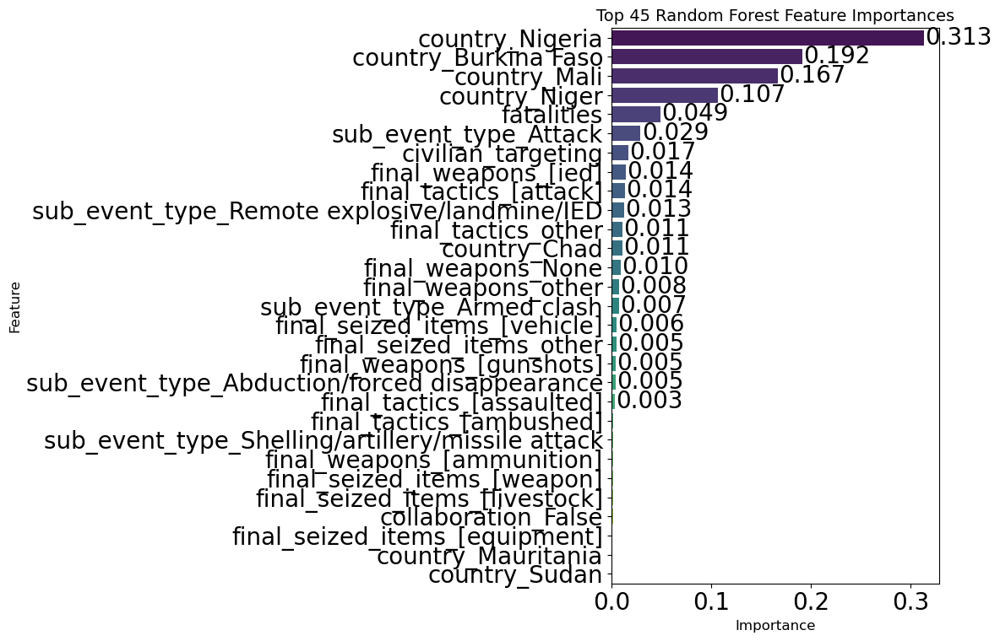


🔻 Features suggested to drop (Random Forest, importance < 0.001):
['country_Mauritania', 'country_Sudan']


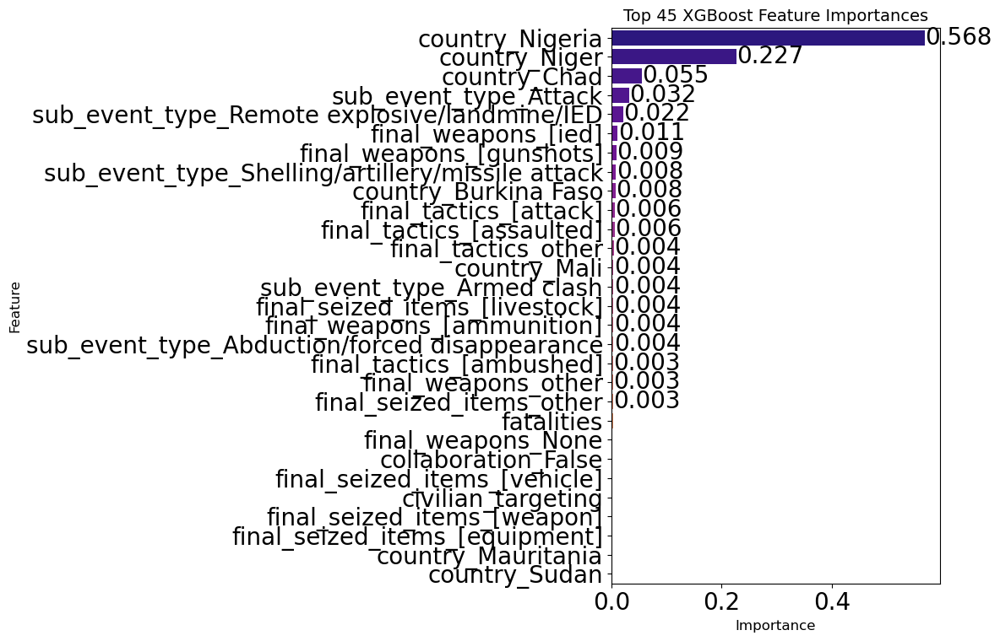


🔻 Features suggested to drop (XGBoost, importance < 0.001):
['country_Mauritania', 'country_Sudan']


In [64]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# === Threshold for dropping features ===
importance_threshold = 0.001  

# === Random Forest Feature Importance ===
rf_row = results_df_b[results_df_b['model'] == 'rfc'].iloc[0]
rf_model = rf_row['estimator']
rf_importances = rf_model.named_steps['clf'].feature_importances_

rf_importance_df = pd.DataFrame({
    'feature': feature_cols,
    'importance': rf_importances
}).sort_values(by='importance', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(data=rf_importance_df.head(45), x='importance', y='feature', palette='viridis')
plt.title('Top 45 Random Forest Feature Importances', fontsize=14)
plt.xlabel('Importance', fontsize=12)
plt.ylabel('Feature', fontsize=12)

# Annotate bars
for i, v in enumerate(rf_importance_df.head(20)['importance']):
    plt.text(v + 0.001, i, f'{v:.3f}', va='center')

plt.tight_layout()
plt.show()

# === Drop suggestion from RF ===
rf_to_drop = rf_importance_df[rf_importance_df['importance'] < importance_threshold]
print(f"\n🔻 Features suggested to drop (Random Forest, importance < {importance_threshold}):")
print(rf_to_drop['feature'].tolist())



# === XGBoost Feature Importance ===
xgb_row = results_df_b[results_df_b['model'] == 'xgb'].iloc[0]
xgb_model = xgb_row['estimator']
xgb_importances = xgb_model.named_steps['clf'].feature_importances_

xgb_importance_df = pd.DataFrame({
    'feature': feature_cols,
    'importance': xgb_importances
}).sort_values(by='importance', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(data=xgb_importance_df.head(45), x='importance', y='feature', palette='plasma')
plt.title('Top 45 XGBoost Feature Importances', fontsize=14)
plt.xlabel('Importance', fontsize=12)
plt.ylabel('Feature', fontsize=12)

# Annotate bars
for i, v in enumerate(xgb_importance_df.head(20)['importance']):
    plt.text(v + 0.001, i, f'{v:.3f}', va='center')

plt.tight_layout()
plt.show()

# === Drop suggestion from XGB ===
xgb_to_drop = xgb_importance_df[xgb_importance_df['importance'] < importance_threshold]
print(f"\n Features suggested to drop (XGBoost, importance < {importance_threshold}):")
print(xgb_to_drop['feature'].tolist())



Country level spatial features prove to be the most important in the model. This makses sense as, for instance, ISIS mosly operates in Nigeria. Weapons, tactics, and other features extracted from the notes section are the make up the rest of the feature importance. 

### Multiclass Modeling

We also wanted to try some multiclass models to see how they would compare. To do so, we added back all of the rows that weren’t ISIS or Al Qaeda affiliated and grouped them together as “other affiliation”.

In [66]:
target_col = 'Target'

# Missing features? final_weapons_[ammunition]', 'final_weapons_[gunshots]
feature_cols = ['civilian_targeting','fatalities', 'sub_event_type_Abduction/forced disappearance', 'sub_event_type_Armed clash',
       'sub_event_type_Attack', 
       'sub_event_type_Remote explosive/landmine/IED',
       'sub_event_type_Shelling/artillery/missile attack', 'collaboration_False', 'final_tactics_[ambushed]',
       'final_tactics_[assaulted]',
       'final_tactics_[attack]', 'final_tactics_other', 'final_weapons_None',
       'final_weapons_[ied]', 'final_weapons_other',
       'final_seized_items_[equipment]', 'final_seized_items_[livestock]',
       'final_seized_items_[vehicle]', 'final_seized_items_[weapon]',
       'final_seized_items_other', 'country_Burkina Faso', 'country_Chad',
       'country_Mali', 'country_Mauritania', 'country_Niger',
       'country_Nigeria', 'country_Sudan']

In [68]:
multiX = enriched_other_df[feature_cols]
multiY = enriched_other_df[target_col]

X_train_multi, X_test_multi, y_train_multi, y_test_multi = train_test_split(multiX, multiY, test_size=0.2, random_state=random_seed, stratify=multiY)

In [70]:
models = {
    'mlpc': MLPClassifier(early_stopping=True, random_state=random_seed),
    'rfc': RandomForestClassifier(class_weight='balanced', random_state=random_seed),
    'xgb': XGBClassifier(random_state=random_seed, eval_metric='logloss')  # suppress warning
}

param_grids = {
    'mlpc': {
    'clf__hidden_layer_sizes': [(100,), (50, 50)],
    'clf__activation': ['relu', 'tanh'],
    'clf__solver': ['adam', 'sgd'],
    'clf__alpha': [0.0001, 0.001],
    'clf__learning_rate_init': [0.001, 0.01],
    'clf__learning_rate': ['constant', 'adaptive'],
    'clf__batch_size': [64, 128]
},
    'rfc': { #random forrest 
        'clf__n_estimators': [100, 200],
        'clf__max_depth': [None, 10, 20]
    },
    'xgb': { #gradient boosted trees 
        'clf__n_estimators': [100, 200],
        'clf__max_depth': [3, 6],
        'clf__learning_rate': [0.05, 0.1]
    }
}

In [81]:
from tqdm import tqdm
results = []

for name, model in tqdm(models.items(), desc="training models"):
    print(f"\nTraining model: {name.upper()}")
    
    pipe = Pipeline([
        ('scaler', StandardScaler()),
        ('clf', model)
    ])
    
    grid = GridSearchCV(pipe, param_grids[name], cv=5, scoring='f1_macro', n_jobs=-1)
    grid.fit(X_train_multi, y_train_multi)
    
    best_model = grid.best_estimator_
    y_pred = best_model.predict(X_test_multi)
    
    report = classification_report(y_test_multi, y_pred, output_dict=True)
    results.append({
        'model': name,
        'best_params': grid.best_params_,
        'f1_macro': report['macro avg']['f1-score'],
        'accuracy': report['accuracy'],
        'estimator' : best_model
    })

# === RESULTS === #
results_df = pd.DataFrame(results)
results_df

training models:   0%|                                                   | 0/3 [00:00<?, ?it/s]


Training model: MLPC


training models:  33%|█████████████                          | 1/3 [39:33<1:19:07, 2373.54s/it]


Training model: RFC


training models:  67%|███████████████████████████▎             | 2/3 [40:14<16:41, 1001.65s/it]


Training model: XGB


training models: 100%|██████████████████████████████████████████| 3/3 [40:49<00:00, 816.45s/it]


model  \
0  mlpc   
1   rfc   
2   xgb   

                                                                                                                                                                                               best_params  \
0  {'clf__activation': 'relu', 'clf__alpha': 0.001, 'clf__batch_size': 128, 'clf__hidden_layer_sizes': (50, 50), 'clf__learning_rate': 'constant', 'clf__learning_rate_init': 0.01, 'clf__solver': 'adam'}   
1                                                                                                                                                         {'clf__max_depth': 10, 'clf__n_estimators': 200}   
2                                                                                                                               {'clf__learning_rate': 0.1, 'clf__max_depth': 6, 'clf__n_estimators': 200}   

   f1_macro  accuracy  \
0  0.794465  0.868857   
1  0.791837  0.839628   
2  0.796484  0.870409   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

The results we got are as follows. The XGBoost model yielded the most accurate results with an accuracy of 0.87 and an f1 score of 0.79 giving it a slight edge over the MLP binary classifier model.

* XGBoost is best model, instead of mlp
* accuracy is __, and f1 score is __

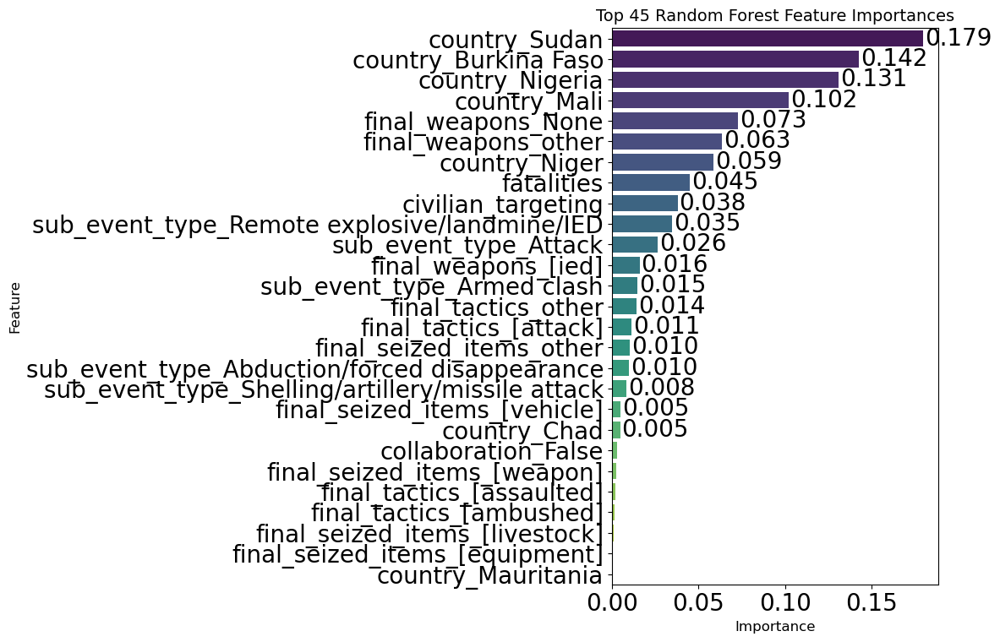


🔻 Features suggested to drop (Random Forest, importance < 0.001):
['final_seized_items_[livestock]', 'final_seized_items_[equipment]', 'country_Mauritania']


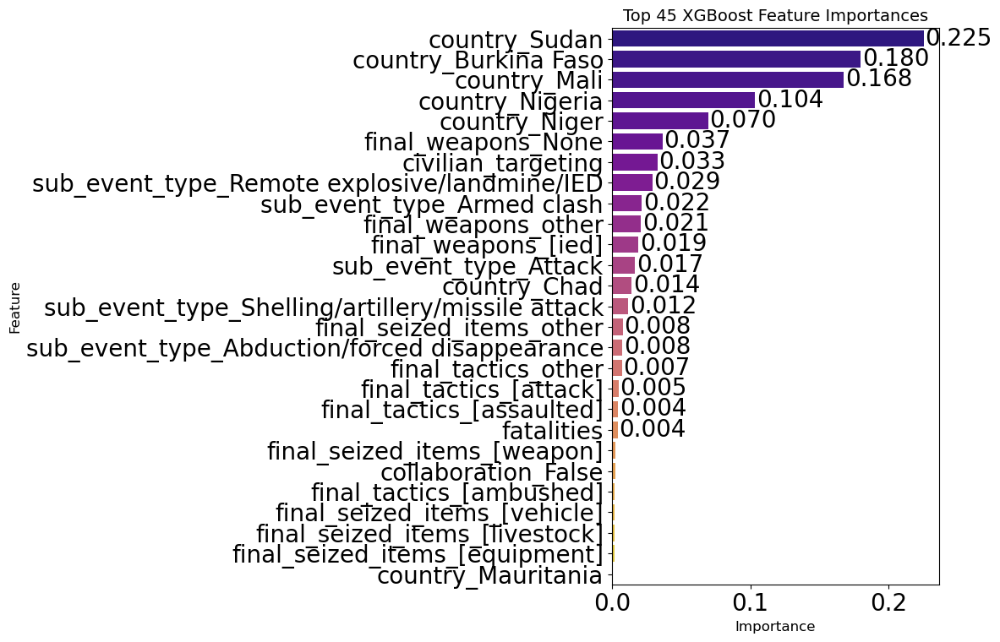


 Features suggested to drop (XGBoost, importance < 0.001):
[]


In [87]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# === Threshold for dropping features ===
importance_threshold = 0.001  

# === Random Forest Feature Importance ===
rf_row = results_df[results_df['model'] == 'rfc'].iloc[0]
rf_model = rf_row['estimator']
rf_importances = rf_model.named_steps['clf'].feature_importances_

rf_importance_df = pd.DataFrame({
    'feature': feature_cols,
    'importance': rf_importances
}).sort_values(by='importance', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(data=rf_importance_df.head(45), x='importance', y='feature', palette='viridis')
plt.title('Top 45 Random Forest Feature Importances', fontsize=14)
plt.xlabel('Importance', fontsize=12)
plt.ylabel('Feature', fontsize=12)

# Annotate bars
for i, v in enumerate(rf_importance_df.head(20)['importance']):
    plt.text(v + 0.001, i, f'{v:.3f}', va='center')

plt.tight_layout()
plt.show()

# === Drop suggestion from RF ===
rf_to_drop = rf_importance_df[rf_importance_df['importance'] < importance_threshold]
print(f"\n🔻 Features suggested to drop (Random Forest, importance < {importance_threshold}):")
print(rf_to_drop['feature'].tolist())



# === XGBoost Feature Importance ===
xgb_row = results_df[results_df['model'] == 'xgb'].iloc[0]
xgb_model = xgb_row['estimator']
xgb_importances = xgb_model.named_steps['clf'].feature_importances_

xgb_importance_df = pd.DataFrame({
    'feature': feature_cols,
    'importance': xgb_importances
}).sort_values(by='importance', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(data=xgb_importance_df.head(45), x='importance', y='feature', palette='plasma')
plt.title('Top 45 XGBoost Feature Importances', fontsize=14)
plt.xlabel('Importance', fontsize=12)
plt.ylabel('Feature', fontsize=12)

# Annotate bars
for i, v in enumerate(xgb_importance_df.head(20)['importance']):
    plt.text(v + 0.001, i, f'{v:.3f}', va='center')

plt.tight_layout()
plt.show()

# === Drop suggestion from XGB ===
xgb_to_drop = xgb_importance_df[xgb_importance_df['importance'] < importance_threshold]
print(f"\n Features suggested to drop (XGBoost, importance < {importance_threshold}):")
print(xgb_to_drop['feature'].tolist())


Our multiclass features charts show a similar trend of spatial features being the most significant indicators of affiliation. 

### Predicting unattributed attacks using trained models
***

In [122]:
# Convert results to a DataFrame (if not already)
# results_df = pd.DataFrame(results)

# Find the row with the best f1_macro score
best_result = results_df.loc[results_df['f1_macro'].idxmax()]

# Get the best model (pipeline) object
best_model = best_result['estimator']

In [124]:
# Missing features? final_weapons_[ammunition]', 'final_weapons_[gunshots]
feature_cols = ['civilian_targeting','fatalities', 'sub_event_type_Abduction/forced disappearance', 'sub_event_type_Armed clash',
       'sub_event_type_Attack', 
       'sub_event_type_Remote explosive/landmine/IED',
       'sub_event_type_Shelling/artillery/missile attack', 'collaboration_False', 'final_tactics_[ambushed]',
       'final_tactics_[assaulted]',
       'final_tactics_[attack]', 'final_tactics_other', 'final_weapons_None',
       'final_weapons_[ied]', 'final_weapons_other',
       'final_seized_items_[equipment]', 'final_seized_items_[livestock]',
       'final_seized_items_[vehicle]', 'final_seized_items_[weapon]',
       'final_seized_items_other', 'country_Burkina Faso', 'country_Chad',
       'country_Mali', 'country_Mauritania', 'country_Niger',
       'country_Nigeria', 'country_Sudan']

In [125]:
# Step 1: Drop extras and keep only what's in feature_cols
unattrib_filt = enriched_unattrib_df.copy()
unattrib_filt = unattrib_filt[[col for col in unattrib_filt.columns if col in feature_cols]]

# Step 2: Add missing columns with 0s
for col in feature_cols:
    if col not in unattrib_filt.columns:
        unattrib_filt[col] = 0

# Step 3: Reorder columns to match model input order
unattrib_filt = unattrib_filt[feature_cols]

# Step 4: Predict and add result to the original dataframe
enriched_unattrib_df['predicted_class'] = best_model.predict(unattrib_filt)

In [127]:
enriched_unattrib_df['predicted_class'].unique()

array([1, 0, 2], dtype=int64)

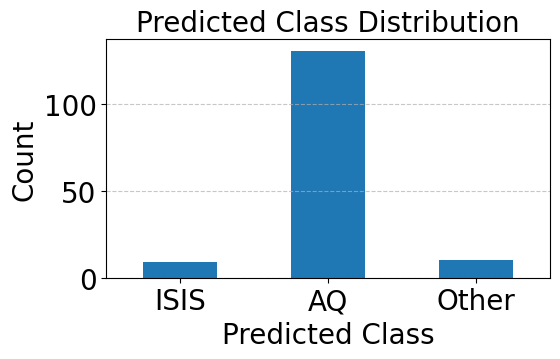

In [131]:
# Count occurrences of each predicted class
class_counts = enriched_unattrib_df['predicted_class'].value_counts().sort_index()

# Plot
plt.figure(figsize=(6, 4))
class_counts.plot(kind='bar')
plt.title('Predicted Class Distribution')
plt.xlabel('Predicted Class')
plt.ylabel('Count')
plt.xticks(ticks=[0, 1, 2], labels=['ISIS', 'AQ', 'Other'], rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

Applying our best model — XGBoost — to the dataset of truly unlabeled data yields very interesting results. The preponderance of events are classified as AQ, with "Other" and ISIS making up the minority. This implies that some attacks described in the data as "Either ISIS or AQ" could have been perpetrated by other actors.

There is evidence to support the idea that most unclaimed attacks would be attributed to AQ. AQ seeks to build community relationships and wants to be seen as a legitimate organization. They may avoid claiming responsibility to reduce backlash or maintain plausible deniability. On the contrary, ISIS seeks to maximize shock value and media attention, so claiming every attack is part of its media strategy.

## Conclusion

It is important to note that our team was also able to classify between groups using no spatial features, still achieving an acceptable F1 score and accuracy (60%). This proves that the patterns in group behavior, in and of themselves, can be used to distinguish between the two groups. This corroborates qualitative research which shows that ISIS is far more violent and is more likely to impose indiscriminate violence against civilians. While AQ groups can participate in similar types of violence, only through the full context of all available features can we accurately classify who perpetrated the violence. This is something very difficult for a qualitative researcher to do, especially at scale.

Spatially and temporally scoping this project would improve the performance of our models as well. An actual customer would be able to assist us with this. However, for the scope of this class, broadly classifying events across the Sahel and during periods of increased violence served as a proof of concept. The performance of our shallow neural network showed the potential for deeper and more complex networks to improve our accuracy. Given more resources and GPU access, we believe that our models could perform even better.

Our project demonstrates the potential of machine learning to enhance conflict analysis in complex environments like the Sahel. By leveraging behavioral patterns alone, we were able to distinguish between VEOs with a reasonable degree of accuracy, validating existing qualitative insights while pushing the boundaries of what quantitative methods can offer. With additional resources, spatial-temporal refinement, and further model development, this approach could serve as a valuable tool for both researchers and policymakers working to understand and mitigate extremist violence in the region.